# 1 In troduction
In this project, we want to use partial correlation network to estimate the covariance matrix. And then use the estimated covriance matrix to construct mean-variance portfolio.

We will use SP100 daily return data. And at the same time the we will use factor models to decompose the covariance matrix in the following way
$$\begin{aligned} r_{i, t} &=\alpha_{i}+\beta_{i}^{\prime} f_{t}+u_{i, t},(1) \\ \Sigma_{r, t} &=B^{\prime} \Sigma_{f, t} B+\Sigma_{u, t},(2) \end{aligned}$$

In this project, we will explore the following questions: 

1, the influence of the number of factors on the estimated network and correlation matrix. 

2, The out-of-sample performance of the estimated covriance matrix compared to Garch-DCC. 

In [51]:
# import modules... which are quite a few!
from math import sqrt
import numpy as np
import pandas as pd
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
import igraph as ig
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression as linreg
from sklearn.covariance import GraphicalLasso as glasso
from sklearn.covariance import GraphicalLassoCV as glasso_cv
sns.set()

In [3]:
sp500_returns = pd.read_csv("/Users/panyiming/Desktop/Mres/Research/network_portforlio/data/df_ret.csv",parse_dates=True)

In [4]:
sp500_returns.drop('Unnamed: 0', axis=1)
cols_sp100 = sorted(list(sp500_returns.columns)[1:101])
sp100 = sp500_returns[cols_sp100]
# number of companies
N = len(sp100.columns)

In [5]:
sectors_ls = ['Materials', 'Communication Services', 'Consumer Cyclical', 
              'Consumer Defensive', 'Energy', 'Financial Services', 'Healthcare',
              'Industrials', 'Real Estate', 'Technology', 'Utilities']
color_dict = {"Materials": "grey", 
              "Consumer Staples": "lightgrey", 
              "Energy": "red", 
              "Financials": "yellow", 
              "Health Care": "pink",
              "Industrials": "purple", 
              "Information Technology": "green",
              "Materials": "brown", 
              "Telecommunications Services":"lightgreen", 
              "Utilities": "orange"}

In [6]:
sp100.head(10)

,Basic Materials_CX,Basic Materials_EMN,Basic Materials_FUL,Basic Materials_MT,Basic Materials_NEM,Basic Materials_NEU,Basic Materials_SCCO,Basic Materials_SSRM,Basic Materials_X,Communication Services_BCE,...,Technology_NSIT,Technology_SMTC,Utilities_AEP,Utilities_D,Utilities_EIX,Utilities_ES,Utilities_EXC,Utilities_NEE,Utilities_PEG,Utilities_SJI
0,-7.830245,-2.452708,-3.019594,3.891749,-7.831215,0.000000,-0.818968,-2.535964,-3.804265,-5.329487,...,-5.977311,-8.701138,1.186000,2.428958,0.992250,0.000000,-0.740556,1.801851,0.731394,0.440055
1,-0.746253,4.846695,0.173793,1.890078,1.117323,0.000000,-0.837409,-8.000088,1.015216,-3.793549,...,0.722169,4.445176,3.664115,2.683577,6.222316,0.601872,4.719294,3.220729,2.517124,0.874343
2,-0.750176,6.116127,-0.928720,3.315571,-1.117323,-1.652711,0.837409,0.000000,0.604387,-5.292864,...,-0.722169,-3.611152,0.566680,1.084550,-0.232214,1.193943,0.176653,0.000000,0.354676,0.431158
3,1.743948,-0.247376,4.779154,3.907768,-3.720005,1.652711,1.231670,5.406722,2.576647,10.102699,...,0.722169,4.295305,1.310165,0.000000,4.100881,0.886432,0.000000,2.839887,-0.709177,0.863052
4,2.189162,-3.146602,0.221888,-0.348897,-0.291969,1.625840,1.633986,0.000000,-0.785926,2.638598,...,0.627379,6.169357,-0.373045,0.000000,0.000000,-0.886432,5.843030,-0.842040,-0.178443,-0.213494
5,-2.686481,-1.157692,-0.444269,-2.120171,5.683313,1.600577,-2.461102,-5.406722,-1.590208,-1.775407,...,-2.625920,-2.762246,0.373045,0.307897,-0.447966,-0.296911,-0.669857,-1.138888,1.241043,0.642243
6,-0.744767,3.182665,2.257717,0.356360,-2.234716,-1.600577,0.000000,10.536052,-3.259219,-3.202705,...,-1.851608,-2.953596,0.740347,0.765017,0.224574,0.593901,0.837894,2.121196,0.176244,-0.642243
7,1.242086,-1.133541,3.266771,2.112709,-3.448596,1.600577,0.827116,7.228272,4.256215,1.103622,...,2.400558,-0.681047,-0.184973,1.211744,-0.673872,-0.891696,2.955963,-0.982308,-0.529667,0.642243
8,2.432349,-1.662011,5.533762,1.727254,-2.666808,-3.226418,3.639624,-2.349256,-2.004031,-0.956106,...,2.166153,19.589643,0.000000,0.300952,-0.904697,-1.504387,-0.324892,-1.853541,-1.604593,0.000000
9,0.000000,-2.478260,-0.199521,-8.576480,6.115404,1.625840,-3.639624,0.000000,-6.913771,5.181925,...,-5.505986,-2.945427,-2.432219,-0.149768,-1.835029,-2.453904,-2.133708,-2.478085,-1.632236,-0.859344


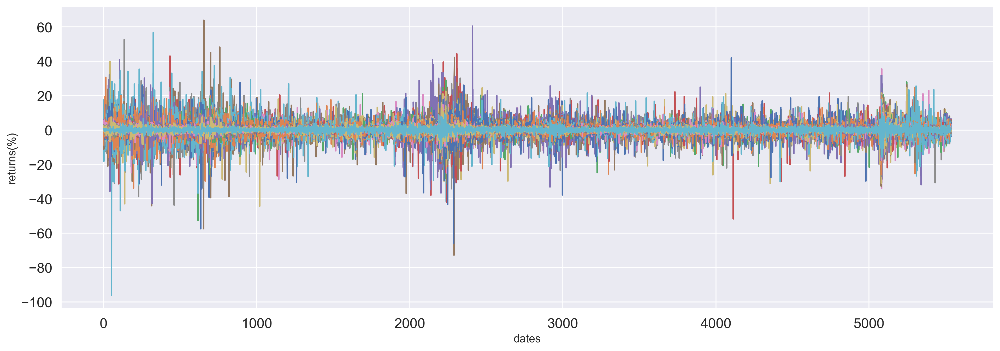

In [7]:
# plot all returns series
plt.rcParams["figure.dpi"] = 256
sp100.plot(figsize=(18, 6),legend=False)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('dates')
plt.ylabel('returns(%)')
plt.show()

In [8]:
df_factors = pd.read_csv('/Users/panyiming/Desktop/Mres/Research/network_portforlio/data/FF5_daily.csv',parse_dates=True)
df_factors = df_factors[(df_factors['Date']>=20000101) & ((df_factors['Date']<=20211231))]
df_factors = df_factors.drop('Date', axis=1)
df_factors.head(10)


,Mkt-RF,SMB,HML,RMW,CMA,RF
9192,-0.71,-0.06,-1.42,-1.50,-0.63,0.021
9193,-4.06,0.33,2.07,0.47,1.45,0.021
9194,-0.09,0.33,0.16,0.41,1.11,0.021
9195,-0.73,-0.05,1.26,0.65,1.22,0.021
9196,3.21,-0.94,-1.43,-0.88,-0.95,0.021
9197,1.76,0.50,-1.52,-1.97,-0.24,0.021
9198,-1.71,0.35,0.81,0.81,1.08,0.021
9199,-0.69,-0.23,0.78,0.42,0.96,0.021
9200,1.59,0.49,-0.91,-1.77,-1.05,0.021
9201,1.15,0.27,-0.65,-0.31,-0.64,0.021


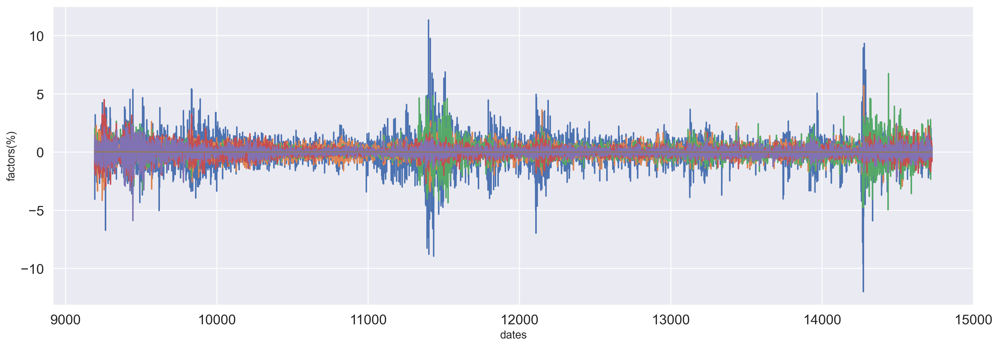

In [9]:
# plot all factors series
plt.rcParams["figure.dpi"] = 256
df_factors.plot(figsize=(18, 6),legend=False)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('dates')
plt.ylabel('factors(%)')
plt.show()

#   2 Descriptive stats

In [10]:
sp100.describe(include='all')

,Basic Materials_CX,Basic Materials_EMN,Basic Materials_FUL,Basic Materials_MT,Basic Materials_NEM,Basic Materials_NEU,Basic Materials_SCCO,Basic Materials_SSRM,Basic Materials_X,Communication Services_BCE,...,Technology_NSIT,Technology_SMTC,Utilities_AEP,Utilities_D,Utilities_EIX,Utilities_ES,Utilities_EXC,Utilities_NEE,Utilities_PEG,Utilities_SJI
count,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,...,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000,5536.000000
mean,0.000488,0.042022,0.036707,0.006843,0.022127,0.059070,0.076612,0.047541,-0.000343,0.037869,...,0.026815,0.020767,0.036350,0.041729,0.029303,0.038947,0.036453,0.064944,0.041066,0.038416
std,2.897352,2.063532,2.396144,3.552738,2.493729,2.897912,2.630649,3.739935,3.570506,1.606451,...,3.480575,3.091672,1.564814,1.405041,2.184809,1.417006,1.668142,1.456842,1.578698,1.552465
min,-24.264135,-14.622808,-20.929130,-27.445926,-15.189839,-29.849045,-22.557112,-28.599857,-31.164568,-41.622700,...,-65.981076,-29.759717,-25.857693,-13.681766,-42.665397,-13.720042,-17.541301,-14.406755,-11.865414,-21.223939
25%,-1.377261,-0.962431,-1.086164,-1.720334,-1.301172,-1.031134,-1.249133,-2.011965,-1.863629,-0.574234,...,-1.247752,-1.411301,-0.649395,-0.588677,-0.773099,-0.612301,-0.750425,-0.603230,-0.696272,-0.664127
50%,0.000000,0.035247,0.038495,0.000000,0.000000,0.000000,0.073893,0.000000,0.000000,0.068441,...,0.054630,0.000000,0.087213,0.054608,0.070509,0.059919,0.081094,0.096841,0.075451,0.053982
75%,1.370888,1.020731,1.143847,1.686009,1.345715,1.164726,1.443142,2.128600,1.883305,0.688020,...,1.325897,1.449041,0.771226,0.755273,0.923874,0.746249,0.867108,0.747687,0.854012,0.790618
max,25.978817,18.954819,21.058429,43.080749,22.453310,24.995601,25.571433,27.652747,21.868123,18.345594,...,27.625034,20.205728,18.099973,15.898830,30.255713,13.802144,16.546193,13.052247,15.808694,17.782072


# 3 The Five factors effect

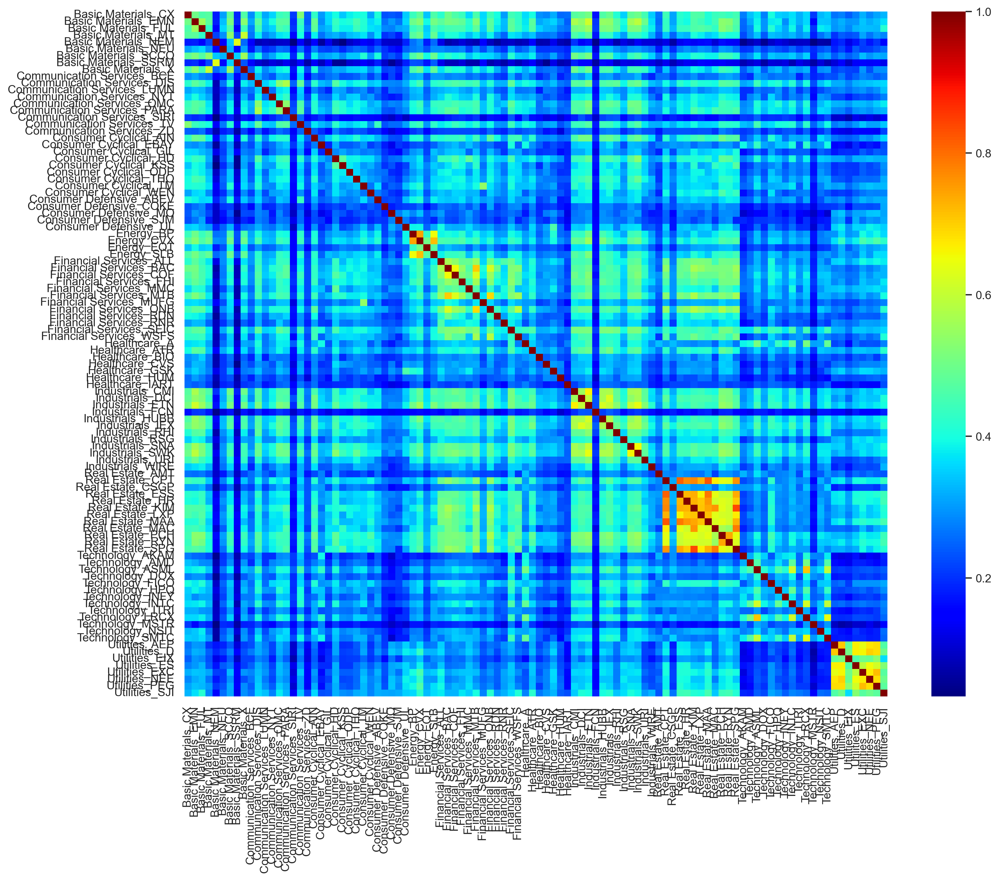

In [11]:
# plot the heatmap of the correlation matrix of the returns
corr = sp100.corr()
plt.figure(figsize=(15,12))
sns.heatmap(corr, xticklabels=sp100.columns,yticklabels=sp100.columns,cmap='jet')
plt.show()

In [12]:
# create the panel of idiosyncratic returns
sp100_idio = pd.DataFrame(columns=sp100.columns,index=sp100.index)

market_factor = df_factors[['Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA']]

betas = np.zeros( (N) )

x = market_factor.values
x = x.reshape(len(x), 5)

for i in range(N):
    y = sp100[ sp100.columns[i] ].values
    y = y.reshape(len(y), 1)
    reg = linreg().fit( x , y  )
    sp100_idio[ sp100_idio.columns[i] ] =  y - reg.predict(x)
    betas[i] = abs(reg.coef_[0][0])

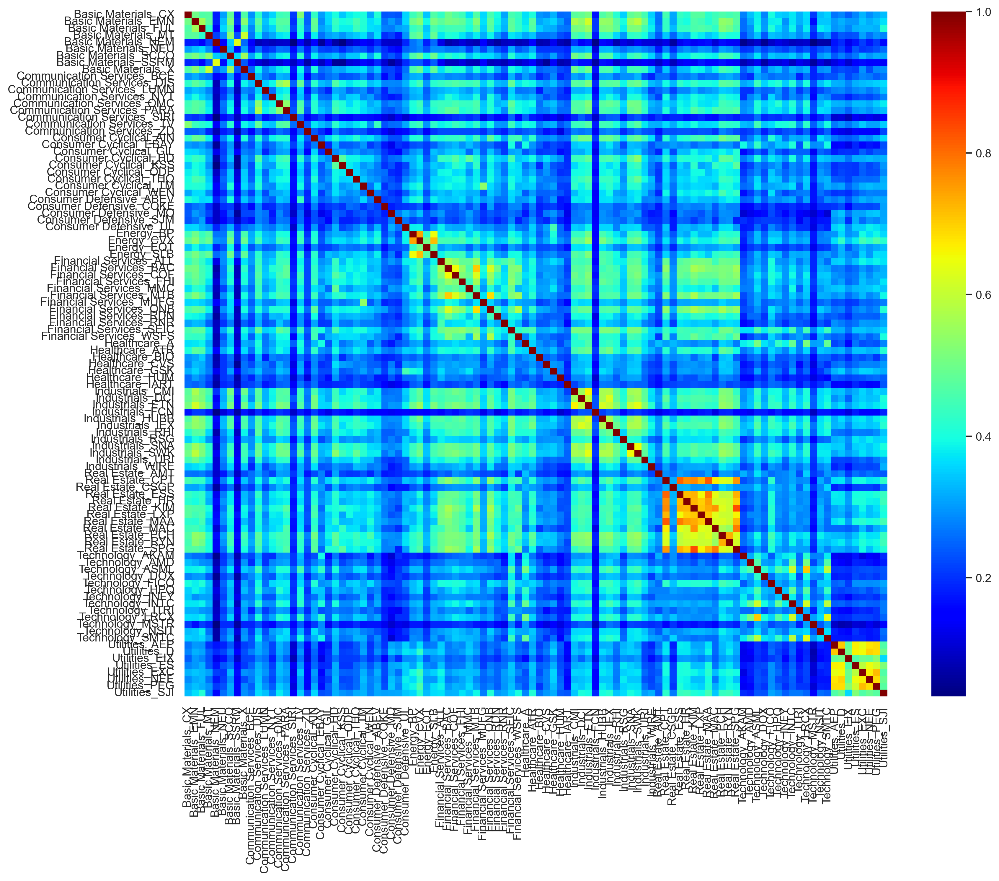

In [13]:
# heatmap of the idiosyncratic correlation 
corr1 = sp100_idio.corr()
plt.figure(figsize=(15,12))
sns.heatmap(corr1, xticklabels=sp100_idio.columns,yticklabels=sp100_idio.columns,cmap='jet')
plt.show()

In [14]:
# we are going to use the GraphicalLasso routine from the sklearn package
# the function requires as imputs alpha=the lasso tuning parameter and 
# the data
sp100_network = glasso(alpha=0.3).fit( sp100 )

# you could also use the following line to tune automatically the shrinkage parameters
sp100_network_opt = glasso_cv().fit( sp100 )

/usr/local/lib/python3.9/site-packages/sklearn/covariance/_graph_lasso.py:315: ConvergenceWarning: graphical_lasso: did not converge after 100 iteration: dual gap: 2.917e-03
  warnings.warn(
/usr/local/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


In [15]:
# compute a number of outputs associatd with the Glasso

# get the precision matrix
K = sp100_network.precision_

# construct the adjencency matrix
A = np.zeros( (N, N) )
for i in range(N):
    for j in range(i-1):
        if abs(K[i,j]) > 0:
            A[i,j] = 1
            A[j,i] = 1

# construct partial correlations            
PC = np.zeros( (N, N) )
for i in range(N):
    for j in range(i-1):
        if abs(K[i,j]) > 0 :
            PC[i,j] = -K[i,j]/sqrt( K[i,i] * K[j,j] )

# compute the degree
degree = A.sum(axis = 0) 

print('Number of connections %d '% (sum(degree)/2) )
print("Network density %2.2f%%" % ( 100*(sum(degree)/2) / (N*(N-1)/2) ) ) 

Number of connections 1509 
Network density 30.48%


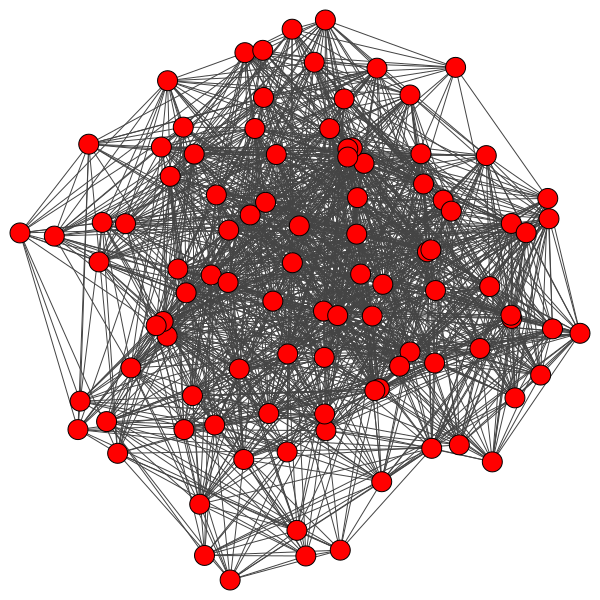

In [16]:
# create a graph object
g = ig.Graph.Adjacency( (A>0).tolist() , mode=ig.ADJ_UNDIRECTED )
ig.plot(g)

# conclusion for Five facotr model:

After regress the return on the five factors, we got the residual parts. But the residual parts are still highly correlated with each other. Seeing from the correlation matrix, there is no sparsity. And the Network density dose not change too much. So we will use PAC to estmate the residual parts.

# 4 PCA

the first principle component accouts for over 30% variance in the return dataset.

[0.31527601 0.05002021 0.03273406 0.02911093 0.02452195 0.02268643
 0.02101481 0.01869704 0.01819243 0.01805261]


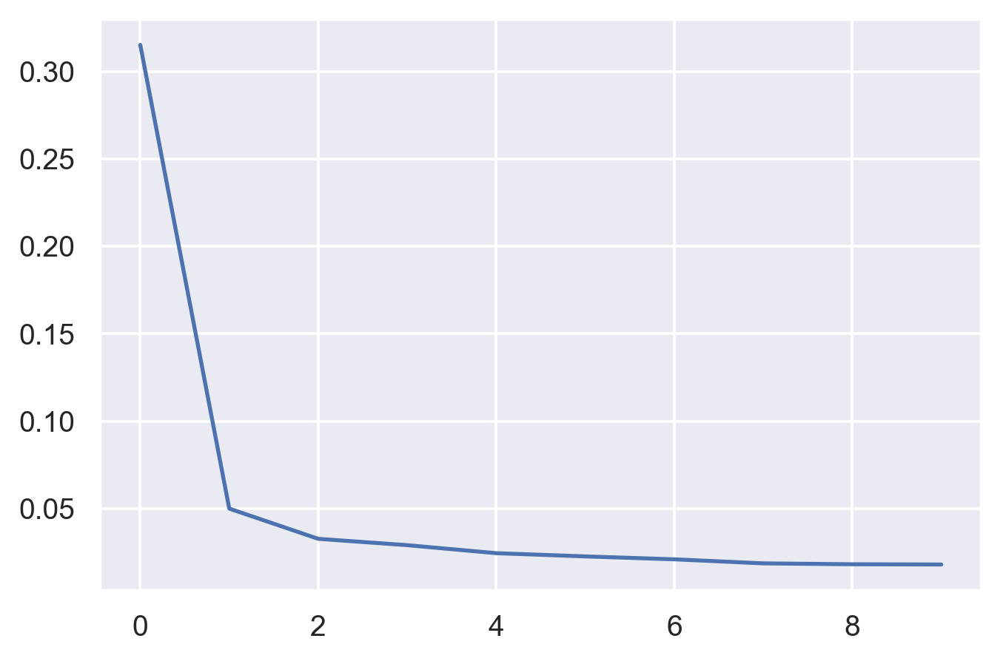

In [17]:
import numpy as np
from sklearn.decomposition import PCA
X = sp100.to_numpy()
pca = PCA(n_components=10)
pca.fit(X)
print(pca.explained_variance_ratio_)
plt.plot(pca.explained_variance_ratio_)

In [18]:
df_pca_factors = pd.DataFrame(X[:, 0:5], columns=['pca1', 'pca2','pca3','pca4','pca5'])
df_pca_factors

,pca1,pca2,pca3,pca4,pca5
0,-7.830245,-2.452708,-3.019594,3.891749,-7.831215
1,-0.746253,4.846695,0.173793,1.890078,1.117323
2,-0.750176,6.116127,-0.928720,3.315571,-1.117323
3,1.743948,-0.247376,4.779154,3.907768,-3.720005
4,2.189162,-3.146602,0.221888,-0.348897,-0.291969
...,...,...,...,...,...
5531,-0.296297,0.678372,0.333186,-0.490973,0.182584
5532,-1.494796,0.391543,0.430404,-0.215581,0.545926
5533,2.528016,-0.474984,-1.321422,-2.150757,1.587423
5534,-0.441502,1.005721,0.693671,0.283060,0.695817


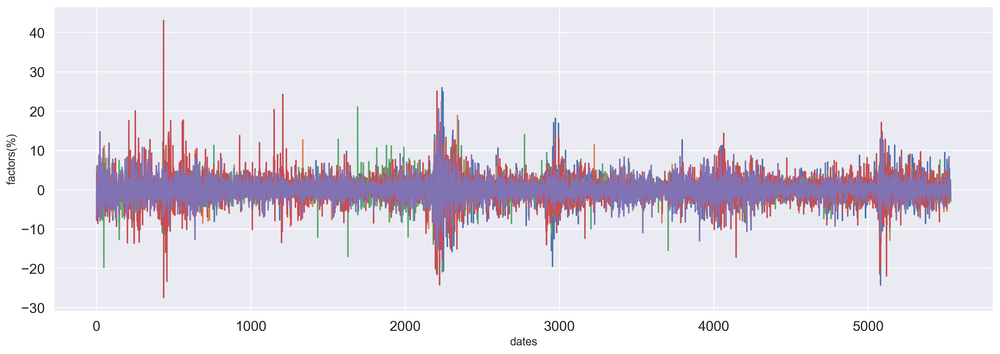

In [19]:
# plot first five PCA factors series
plt.rcParams["figure.dpi"] = 256
df_pca_factors.plot(figsize=(18, 6),legend=False)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('dates')
plt.ylabel('factors(%)')
plt.show()

In [20]:
X1_PCA = pca.transform(X)[:, 0]
X3_PCA = pca.transform(X)[:, 0:3]

## 4.1 first principle components

In [21]:
sp100_pca1_idio = pd.DataFrame(columns=sp100.columns,index=sp100.index)

X1_PCA = X1_PCA.reshape(len(X1_PCA), 1)
for i in range(N):
    y = sp100[ sp100.columns[i] ].values
    y = y.reshape(len(y), 1)
    reg = linreg().fit( X1_PCA , y  )
    sp100_pca1_idio[ sp100_pca1_idio.columns[i] ] =  y - reg.predict(X1_PCA)
    betas[i] = abs(reg.coef_[0][0])
    
# we are going to use the GraphicalLasso routine from the sklearn package
# the function requires as imputs alpha=the lasso tuning parameter and 
# the data
sp100_network_pca1 = glasso(alpha=0.3).fit( sp100_pca1_idio )

# you could also use the following line to tune automatically the shrinkage parameters
sp100_network_opt__pca1 = glasso_cv().fit( sp100_pca1_idio )
# compute a number of outputs associatd with the Glasso

# get the precision matrix
K = sp100_network_pca1.precision_

# construct the adjencency matrix
A = np.zeros( (N, N))
for i in range(N):
    for j in range(i-1):
        if abs(K[i,j]) > 0:
            A[i,j] = 1
            A[j,i] = 1

# construct partial correlations            
PC = np.zeros( (N, N) )
for i in range(N):
    for j in range(i-1):
        if abs(K[i,j]) > 0 :
            PC[i,j] = -K[i,j]/sqrt( K[i,i] * K[j,j] )

# compute the degree
degree = A.sum(axis = 0) 

print('Number of connections %d '% (sum(degree)/2) )
print("Network density %2.2f%%" % ( 100*(sum(degree)/2) / (N*(N-1)/2) ) ) 

Number of connections 682 
Network density 13.78%


/usr/local/lib/python3.9/site-packages/numpy/core/_methods.py:230: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


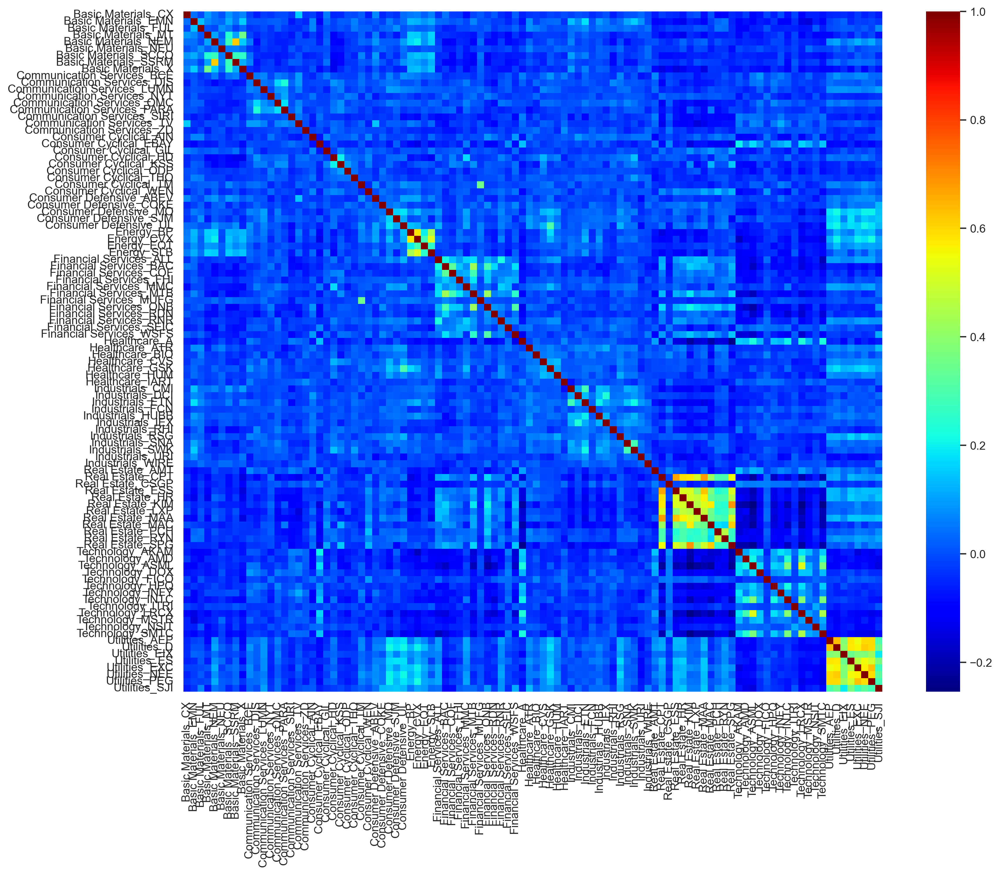

In [22]:
# heatmap of the idiosyncratic correlation 
corr_pca1 = sp100_pca1_idio.corr()
plt.figure(figsize=(15,12))
sns.heatmap(corr_pca1, xticklabels=sp100_idio.columns,yticklabels=sp100_idio.columns,cmap='jet')
plt.show()

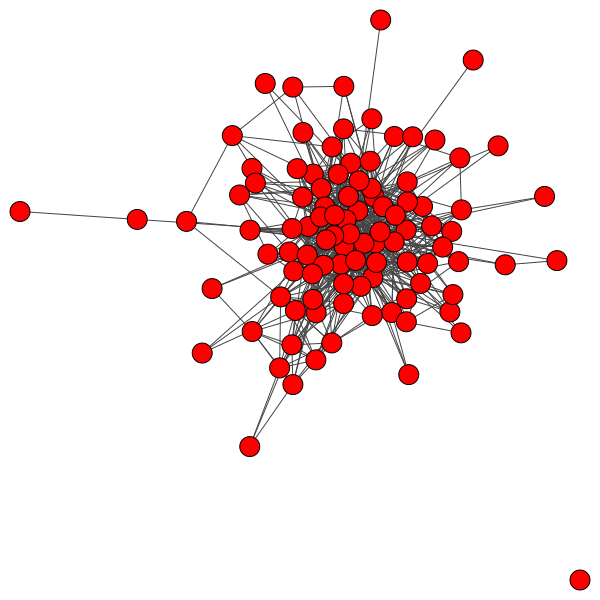

In [23]:
# create a graph object
g = ig.Graph.Adjacency( (A>0).tolist() , mode=ig.ADJ_UNDIRECTED )
ig.plot(g)

## 4.2 first three principle components 

In [25]:
sp100_pca3_idio = pd.DataFrame(columns=sp100.columns,index=sp100.index)

X3_PCA = X3_PCA.reshape(len(X3_PCA), 3)
for i in range(N):
    y = sp100[ sp100.columns[i] ].values
    y = y.reshape(len(y), 1)
    reg = linreg().fit( X3_PCA , y  )
    sp100_pca3_idio[ sp100_pca3_idio.columns[i] ] =  y - reg.predict(X3_PCA)
    betas[i] = abs(reg.coef_[0][0])
    
# we are going to use the GraphicalLasso routine from the sklearn package
# the function requires as imputs alpha=the lasso tuning parameter and 
# the data
sp100_network_pca3 = glasso(alpha=0.3).fit( sp100_pca3_idio )

# you could also use the following line to tune automatically the shrinkage parameters
#sp100_network_opt__pca3 = glasso_cv().fit( sp100_pca3_idio)
# compute a number of outputs associatd with the Glasso

# get the precision matrix
K = sp100_network_pca3.precision_

# construct the adjencency matrix
A = np.zeros((N, N))
for i in range(N):
    for j in range(i-1):
        if abs(K[i,j]) > 0:
            A[i,j] = 1
            A[j,i] = 1

# construct partial correlations            
PC = np.zeros((N, N))
for i in range(N):
    for j in range(i-1):
        if abs(K[i,j]) > 0 :
            PC[i,j] = -K[i,j]/sqrt( K[i,i] * K[j,j])

# compute the degree
degree = A.sum(axis = 0) 

print('Number of connections %d '% (sum(degree)/2) )
print("Network density %2.2f%%" % ( 100*(sum(degree)/2) / (N*(N-1)/2) ) ) 

Number of connections 399 
Network density 8.06%


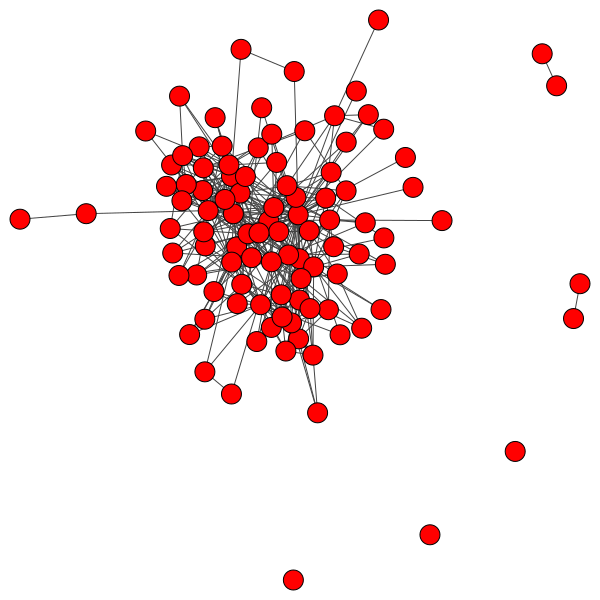

In [26]:
# create a graph object
g = ig.Graph.Adjacency( (A>0).tolist() , mode=ig.ADJ_UNDIRECTED )
ig.plot(g)

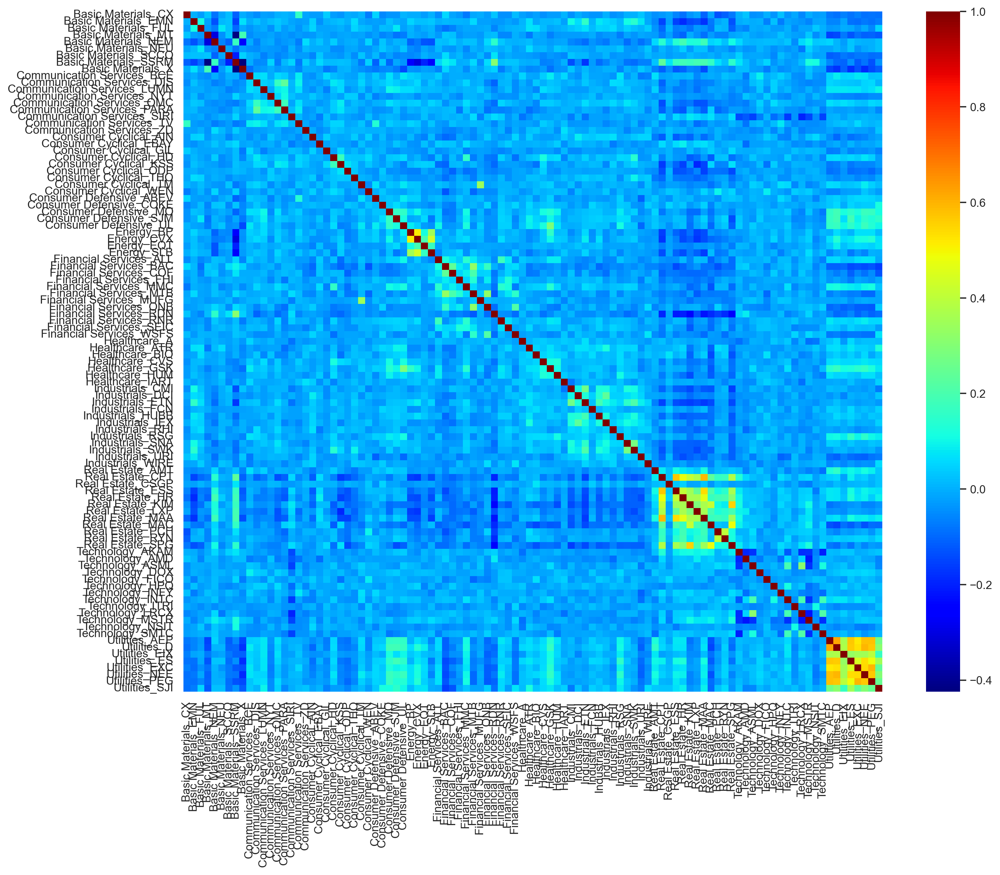

In [27]:
# heatmap of the idiosyncratic correlation 
corr_pca3 = sp100_pca3_idio.corr()
plt.figure(figsize=(15,12))
sns.heatmap(corr_pca3, xticklabels=sp100_pca3_idio.columns,yticklabels=sp100_pca3_idio.columns,cmap='jet')
plt.show() 

# 4.3 conclusion for PCA method

We use the PCA mehtod to extract the priciple components. After we detract the first component, the density of estimated 
network reduce significantly. After we detract the first three components, the density of estimated network reduce  to 8.08\%. The correlation of the residual parts also decreases obviously. So in the following precision matrix estimation we will use PCA factors.

# 5 minimum variance portflio construction

In this section, we will compare the performance of our minimum-variance portfolio. The baseline model is sample covariance. In addition, we also include sample covariance portfolio and average portfolio in our comparision. For the covariance matrix estimation, we will use 5-year(1260 days) historical data and then predcit the following one month(21 days) covariance matrix. Then finally throng the estimated covariance matrix, we will cosntruction minimum variance portfolio and compare the out-of-sample variance according to the variance of the daily return of our portfolos.

In [173]:
from cvxopt import matrix
from cvxopt.blas import dot 
from cvxopt import solvers
solvers.options['show_progress'] = False

def get_return(weights, res_pre):
    weights = np.matrix(weights)
    res_pre = np.matrix(res_pre)
    return (weights*res_pre).tolist()[0]

def network_cov(X, factor_num = 1):
    # PCA to get facctors:
    N = X.shape[1]
    Betas = np.zeros((N, factor_num))
    res = np.zeros_like(X)
    pca = PCA(n_components=5)
    pca.fit(X)
    X_PCA = pca.transform(X)[:, 0:factor_num]
    # regress to get factor loading and residuals:
    for i in range(N):
        y = X[:, i:i+1]
        reg = linreg().fit(X_PCA , y  )
        res[:, i:i+1] =  y - reg.predict(X_PCA)
        Betas[i, :] = reg.coef_ 
    # estimate partial correlation:
    res_cov = glasso(alpha=0.05, mode='cd', tol=0.001).fit(res).covariance_
    # recover covariance matrix:
    factor_cov = np.reshape(np.cov(X_PCA.T), (factor_num, factor_num))
    Cov = np.matmul(np.matmul(Betas, factor_cov), Betas.T) + res_cov
    return Cov

def get_ws_cov(cov, no_short=False):
    if no_short:
        N = cov.shape[0]
        P = matrix(cov)
        q = matrix(np.zeros((N, 1)))
        G  = matrix(-np.identity(N))
        h = matrix(np.zeros((N, 1)))
        A = matrix(1.0, (1, N))
        b = matrix(1.0)
        sol = solvers.qp(P, q, G, h, A, b)
        ws = np.matrix(sol['x']).T
    else:
        cov_mat = np.matrix(cov)
        N = cov_mat.shape[0]
        I = np.matrix(np.ones(N)).T
        ws = (cov_mat.I * I)/(I.T*cov_mat.I*I)
        ws = ws.T
    return ws

def get_hold_ws(ws1, res_mat_pre):
    ws11 = np.multiply(ws1, (1+np.sum(res_mat_pre, axis=1)))
    ws11 = ws11
    return ws11.tolist()[0]

def get_rets_net(X_ret, factor_num=1):
    rets = []
    set_ws = []
    ed_idx = 0
    for i in tqdm(range(200)):
        st_idx = i*21
        ed_idx = 1260 + i*21
        res_mat_i = X_ret[st_idx:ed_idx, :]
        cov_i = network_cov(res_mat_i, factor_num = factor_num)
        cov_i[cov_i<0.0000001] = 0
        ws_i = get_ws_cov(cov_i, no_short=False)
        st_idx_next = ed_idx+1 
        ed_idx_next = ed_idx+22
        ret_next_i = X_ret[st_idx_next:ed_idx_next, :]
        ret_next_i = np.matrix(ret_next_i).T
        ret_i = get_return(ws_i, ret_next_i)
        set_ws.append(ws_i.tolist()[0])
        rets += ret_i
    return rets

def get_rets_sample(X_ret):
    rets = []
    set_ws = []
    ed_idx = 0
    for i in tqdm(range(200)):
        st_idx = i*21
        ed_idx = 1260 + i*21
        res_mat_i = X_ret[st_idx:ed_idx, :]
        cov_i = np.cov(res_mat_i.T)
        ws_i = get_ws_cov(cov_i, no_short=False)
        st_idx_next = ed_idx+1 
        ed_idx_next = ed_idx+22
        ret_next_i = X_ret[st_idx_next:ed_idx_next, :]
        ret_next_i = np.matrix(ret_next_i).T
        ret_i = get_return(ws_i, ret_next_i)
        set_ws.append(ws_i.tolist()[0])
        rets += ret_i
    return rets

In [82]:
rets_sam = get_rets_sample(X)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:00<00:00, 668.84it/s]


In [174]:
rets_net3 = get_rets_net(X, factor_num=3)

 26%|███████████████████████████▊                                                                                 | 51/200 [00:06<00:17,  8.36it/s]/usr/local/lib/python3.9/site-packages/sklearn/covariance/_graph_lasso.py:261: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0056771890612026255, tolerance: 0.0019158760369146508
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
 26%|████████████████████████████▎                                                                                | 52/200 [00:06<00:18,  8.17it/s]/usr/local/lib/python3.9/site-packages/sklearn/covariance/_graph_lasso.py:261: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.005237250544078975, tolerance: 0.0020323077597816327
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
 26%|████████████████████████████▉                                                             

In [175]:
rets_net = get_rets_net(X)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:21<00:00,  9.26it/s]


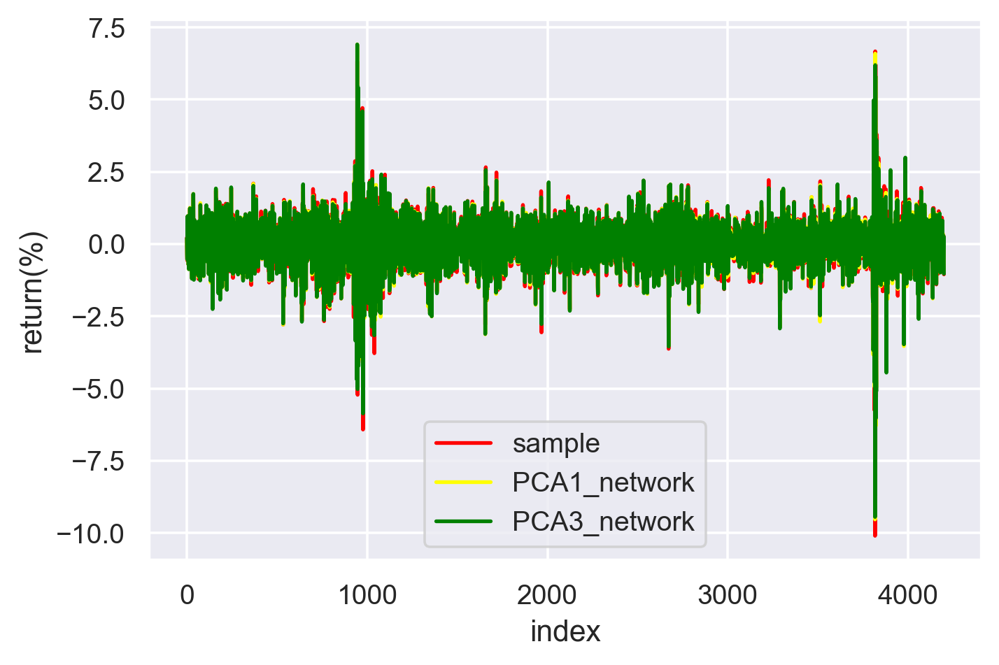

In [176]:
plt.plot(rets_sam, color='red',  label='sample')
plt.plot(rets_net, color='yellow', label='PCA1_network')
plt.plot(rets_net3, color='green', label='PCA3_network')
plt.xlabel('index')
plt.ylabel('return(%)')
plt.legend()

In [177]:
from scipy import stats
indicators = np.zeros((3,4))
d = 252
d2 = 252**0.5
indicators[0, :] = [np.mean(rets_sam)*d, np.std(rets_sam)*d2, np.mean(rets_sam)*d2/np.std(rets_sam)*0.5, 1]
indicators[1, :] = [np.mean(rets_net)*d, np.std(rets_net)*d2, np.mean(rets_net)*d2/np.std(rets_net)*0.5, stats.ttest_ind(rets_sam*d,rets_net*d)[1]]
indicators[2, :] = [np.mean(rets_net3)*d, np.std(rets_net3)*d2, np.mean(rets_net3)*d2/np.std(rets_net3)*0.5, stats.ttest_ind(rets_sam*d,rets_net3*d)[1]]
df_indicators  = pd.DataFrame(indicators, columns=['mean', 'variance', 'sharp_ratio', 'significant difference'])
df_indicators['estimator'] = ['sample', 'PCA1_network', 'PCA3_network']

In [178]:
df_indicators

,mean,variance,sharp_ratio,significant difference,estimator
0,8.194586,13.379137,0.306245,1.000000,sample
1,8.845999,13.179566,0.335595,0.024583,PCA1_network
2,8.929621,13.172732,0.338943,0.011177,PCA3_network


# Conclusion:

Seeing from the table, the networks estimators are slightly better than the sample covariance and the difference is 5% significant. But If we increase the number of assets, the difference will become more signifcant.